In [1]:
# =========================================================
# PORTION 1 (FIXED): DATA + SPLIT (YOUR REAL DATA FORMAT)
# =========================================================

import os
import random
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.model_selection import train_test_split

import torch

# ================= SEED =================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

# ================= PATH =================
DATASET_PATH = "/kaggle/input/datasets/ajfaisal002/crossmodal-misleading-video-dataset"

TRAIN_FRAMES = os.path.join(DATASET_PATH, "dataset_kaggle/extracted_frames/train")
TEST_FRAMES  = os.path.join(DATASET_PATH, "dataset_kaggle/extracted_frames/test")

TRAIN_AUDIO = os.path.join(DATASET_PATH, "extracted_audio/extracted_audio/train")
TEST_AUDIO  = os.path.join(DATASET_PATH, "extracted_audio/extracted_audio/test")

TRAIN_META = os.path.join(DATASET_PATH, "dataset_kaggle/extracted_text/train_metadata.csv")
TEST_META  = os.path.join(DATASET_PATH, "dataset_kaggle/extracted_text/test_metadata.csv")

train_df = pd.read_csv(TRAIN_META)
test_df  = pd.read_csv(TEST_META)

# ================= CLEAN TEXT =================
train_df["transcript"] = train_df["transcript"].fillna("").astype(str)
train_df["ocr_text"]   = train_df["ocr_text"].fillna("").astype(str)

test_df["transcript"] = test_df["transcript"].fillna("").astype(str)
test_df["ocr_text"]   = test_df["ocr_text"].fillna("").astype(str)

# Combine text
train_df["full_text"] = train_df["transcript"] + " " + train_df["ocr_text"]
test_df["full_text"]  = test_df["transcript"] + " " + test_df["ocr_text"]

# =========================================================
# STAGE-1 LABEL (BINARY)
# =========================================================
# safe → 0
# misleading → 1

train_df["label_binary"] = train_df["category"].map({
    "safe": 0,
    "misleading": 1
})

test_df["label_binary"] = test_df["category"].map({
    "safe": 0,
    "misleading": 1
})

# =========================================================
# STAGE-2 LABEL (MULTICLASS)
# Only for misleading videos
# =========================================================

STAGE2_CLASSES = [
    "identity_fabrication",
    "perception_manipulation",
    "scientifically_unrealistic_scene",
    "surreal_content"
]

stage2_map = {c: i for i, c in enumerate(STAGE2_CLASSES)}

def get_stage2(label):
    if pd.isna(label):
        return -1   # safe videos
    return stage2_map[label]

train_df["label_stage2"] = train_df["subcategory"].apply(get_stage2)
test_df["label_stage2"]  = test_df["subcategory"].apply(get_stage2)

# =========================================================
# TRAIN / VALID SPLIT
# =========================================================

train_df, val_df = train_test_split(
    train_df,
    test_size=0.15,
    stratify=train_df["category"],  # VERY IMPORTANT
    random_state=SEED
)

print("\nSplit:")
print("Train:", len(train_df))
print("Validation:", len(val_df))
print("Test:", len(test_df))

# =========================================================
# CHECK DISTRIBUTION
# =========================================================

print("\nTrain category distribution:")
print(train_df["category"].value_counts())

print("\nValidation category distribution:")
print(val_df["category"].value_counts())

print("\nBinary distribution (Train):")
print(train_df["label_binary"].value_counts())

print("\nStage-2 distribution (Train, excluding -1):")
print(train_df[train_df["label_stage2"] != -1]["label_stage2"].value_counts())

Using device: cuda

Split:
Train: 1360
Validation: 240
Test: 800

Train category distribution:
category
safe          680
misleading    680
Name: count, dtype: int64

Validation category distribution:
category
safe          120
misleading    120
Name: count, dtype: int64

Binary distribution (Train):
label_binary
0    680
1    680
Name: count, dtype: int64

Stage-2 distribution (Train, excluding -1):
label_stage2
3    179
1    168
2    167
0    166
Name: count, dtype: int64


In [2]:
# =========================================================
# PORTION 2 (FIXED): DATASET CLASS WITH YOUR PATHS
# =========================================================

import librosa
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms

from transformers import AutoTokenizer

# ================= TRANSFORMS =================
frame_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# ================= TOKENIZER =================
tokenizer = AutoTokenizer.from_pretrained("xlm-roberta-base")

# =========================================================
# DATASET CLASS
# =========================================================

class MultimodalDataset(Dataset):
    def __init__(self, df, frame_root, audio_root, max_frames=16):
        self.df = df.reset_index(drop=True)
        self.frame_root = frame_root
        self.audio_root = audio_root
        self.max_frames = max_frames

    def __len__(self):
        return len(self.df)

    # ---------------- FRAME LOADER ----------------
    def load_frames(self, video_id):
        folder = os.path.join(self.frame_root, video_id)

        if not os.path.exists(folder):
            return torch.zeros(self.max_frames, 3, 224, 224)

        frames = sorted(os.listdir(folder))[:self.max_frames]

        imgs = []
        for f in frames:
            try:
                img = Image.open(os.path.join(folder, f)).convert("RGB")
                img = frame_transform(img)
                imgs.append(img)
            except:
                imgs.append(torch.zeros(3, 224, 224))

        while len(imgs) < self.max_frames:
            imgs.append(torch.zeros(3, 224, 224))

        return torch.stack(imgs)

    # ---------------- AUDIO LOADER ----------------
    def load_audio(self, video_id, has_audio):
        if has_audio == 0:
            return torch.zeros(16000)

        path = os.path.join(self.audio_root, f"{video_id}.wav")

        if not os.path.exists(path):
            return torch.zeros(16000)

        try:
            audio, sr = librosa.load(path, sr=16000)
        except:
            return torch.zeros(16000)

        if len(audio) < 16000:
            audio = np.pad(audio, (0, 16000 - len(audio)))
        else:
            audio = audio[:16000]

        return torch.tensor(audio)

    # ---------------- TEXT ----------------
    def load_text(self, text):
        enc = tokenizer(
            text,
            padding="max_length",
            truncation=True,
            max_length=128,
            return_tensors="pt"
        )
        return enc["input_ids"].squeeze(0), enc["attention_mask"].squeeze(0)

    # ---------------- MAIN ----------------
    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        video_id = row["video_id"]

        frames = self.load_frames(video_id)
        audio = self.load_audio(video_id, row["has_audio"])
        input_ids, attn_mask = self.load_text(row["full_text"])

        return {
            "frames": frames,
            "audio": audio,
            "input_ids": input_ids,
            "attention_mask": attn_mask,
            "label_binary": torch.tensor(row["label_binary"]),
            "label_stage2": torch.tensor(row["label_stage2"])
        }

In [3]:
train_dataset = MultimodalDataset(
    train_df,
    frame_root=TRAIN_FRAMES,
    audio_root=TRAIN_AUDIO
)

sample = train_dataset[0]

print("Frames:", sample["frames"].shape)
print("Audio:", sample["audio"].shape)
print("Text:", sample["input_ids"].shape)
print("Binary:", sample["label_binary"])
print("Stage2:", sample["label_stage2"])

Frames: torch.Size([16, 3, 224, 224])
Audio: torch.Size([16000])
Text: torch.Size([128])
Binary: tensor(0)
Stage2: tensor(-1)


In [4]:
# =========================================================
# PORTION 3: FEATURE EXTRACTORS (FULL CPU SAFE VERSION)
# =========================================================

import torch
import torch.nn as nn

from transformers import (
    CLIPModel,
    AutoModel,
    Wav2Vec2Model
)

DEVICE_CPU = "cpu"

print("Loading models on CPU...")

# ================= LOAD MODELS =================
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(DEVICE_CPU)
text_model = AutoModel.from_pretrained("xlm-roberta-base").to(DEVICE_CPU)
audio_model = Wav2Vec2Model.from_pretrained("facebook/wav2vec2-base").to(DEVICE_CPU)

# ================= FREEZE =================
for p in clip_model.parameters():
    p.requires_grad = False

for p in text_model.parameters():
    p.requires_grad = False

for p in audio_model.parameters():
    p.requires_grad = False

clip_model.eval()
text_model.eval()
audio_model.eval()

print("Models loaded & frozen on CPU ✅")

# =========================================================
# TEMPORAL ATTENTION
# =========================================================

class TemporalAttention(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.attn = nn.Linear(dim, 1)

    def forward(self, x):
        x = x.to(DEVICE_CPU)
        w = torch.softmax(self.attn(x), dim=1)
        out = (x * w).sum(dim=1)
        return out


# =========================================================
# FEATURE EXTRACTOR
# =========================================================

class FeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        self.temporal_attn = TemporalAttention(768)

    # ---------------- VISION ----------------
    def extract_vision(self, frames):
        B, T, C, H, W = frames.shape

        frames = frames.view(B * T, C, H, W).to(DEVICE_CPU).float()

        with torch.no_grad():
            outputs = clip_model.vision_model(pixel_values=frames)
            feats = outputs.pooler_output

        feats = feats.view(B, T, -1)

        video_feat = self.temporal_attn(feats)

        return video_feat  # (B,768)

    # ---------------- TEXT ----------------
    def extract_text(self, input_ids, attention_mask):

        input_ids = input_ids.to(DEVICE_CPU)
        attention_mask = attention_mask.to(DEVICE_CPU)

        with torch.no_grad():
            outputs = text_model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )

        last_hidden = outputs.last_hidden_state

        mask = attention_mask.unsqueeze(-1)
        summed = (last_hidden * mask).sum(1)
        counts = mask.sum(1)

        text_feat = summed / counts
        return text_feat

    # ---------------- AUDIO ----------------
    def extract_audio(self, audio):

        audio = audio.to(DEVICE_CPU).float()

        with torch.no_grad():
            outputs = audio_model(audio)

        hidden = outputs.last_hidden_state

        audio_feat = hidden.mean(dim=1)
        return audio_feat

    # ---------------- FORWARD ----------------
    def forward(self, frames, input_ids, attention_mask, audio):

        v = self.extract_vision(frames)
        t = self.extract_text(input_ids, attention_mask)
        a = self.extract_audio(audio)

        return v, t, a

Loading models on CPU...


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

XLMRobertaModel LOAD REPORT from: xlm-roberta-base
Key                       | Status     |  | 
--------------------------+------------+--+-
lm_head.dense.bias        | UNEXPECTED |  | 
lm_head.dense.weight      | UNEXPECTED |  | 
lm_head.layer_norm.weight | UNEXPECTED |  | 
lm_head.layer_norm.bias   | UNEXPECTED |  | 
lm_head.bias              | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/211 [00:00<?, ?it/s]

Wav2Vec2Model LOAD REPORT from: facebook/wav2vec2-base
Key                          | Status     |  | 
-----------------------------+------------+--+-
quantizer.weight_proj.weight | UNEXPECTED |  | 
project_hid.weight           | UNEXPECTED |  | 
project_hid.bias             | UNEXPECTED |  | 
project_q.weight             | UNEXPECTED |  | 
project_q.bias               | UNEXPECTED |  | 
quantizer.weight_proj.bias   | UNEXPECTED |  | 
quantizer.codevectors        | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Models loaded & frozen on CPU ✅


In [5]:
feature_extractor = FeatureExtractor()

sample = train_dataset[0]

frames = sample["frames"].unsqueeze(0)
audio = sample["audio"].unsqueeze(0)
input_ids = sample["input_ids"].unsqueeze(0)
attn_mask = sample["attention_mask"].unsqueeze(0)

v, t, a = feature_extractor(frames, input_ids, attn_mask, audio)

print("Vision:", v.shape)
print("Text:", t.shape)
print("Audio:", a.shape)

Vision: torch.Size([1, 768])
Text: torch.Size([1, 768])
Audio: torch.Size([1, 768])


In [6]:
# =========================================================
# PORTION 4: FUSION + CLASSIFIER (CORE MODEL)
# =========================================================

import torch.nn.functional as F

# =========================================================
# CROSS-MODAL ATTENTION
# =========================================================

class CrossModalAttention(nn.Module):
    def __init__(self, dim=768):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim=dim, num_heads=8, batch_first=True)

    def forward(self, v, t, a):
        # Stack modalities → (B, 3, 768)
        x = torch.stack([v, t, a], dim=1)

        # Self-attention across modalities
        out, _ = self.attn(x, x, x)

        # Split back
        v_out, t_out, a_out = out[:, 0], out[:, 1], out[:, 2]

        return v_out, t_out, a_out


# =========================================================
# GATED FUSION
# =========================================================

class GatedFusion(nn.Module):
    def __init__(self, dim=768):
        super().__init__()

        self.Wv = nn.Linear(dim, dim)
        self.Wt = nn.Linear(dim, dim)
        self.Wa = nn.Linear(dim, dim)

    def forward(self, v, t, a):

        g_v = torch.sigmoid(self.Wv(v))
        g_t = torch.sigmoid(self.Wt(t))
        g_a = torch.sigmoid(self.Wa(a))

        fusion = g_v * v + g_t * t + g_a * a

        return fusion


# =========================================================
# FINAL MODEL
# =========================================================

class MultimodalModel(nn.Module):
    def __init__(self):
        super().__init__()

        self.feature_extractor = FeatureExtractor()

        self.cross_attn = CrossModalAttention()
        self.fusion = GatedFusion()

        # Shared projection
        self.fc = nn.Linear(768, 512)

        # Heads
        self.binary_head = nn.Linear(512, 2)   # Stage-1
        self.multi_head = nn.Linear(512, 4)    # Stage-2

    def forward(self, frames, input_ids, attention_mask, audio):

        # Feature extraction
        v, t, a = self.feature_extractor(frames, input_ids, attention_mask, audio)

        # Cross-modal interaction
        v, t, a = self.cross_attn(v, t, a)

        # Gated fusion
        fused = self.fusion(v, t, a)

        # Shared feature
        shared = F.relu(self.fc(fused))

        # Outputs
        out_binary = self.binary_head(shared)
        out_multi = self.multi_head(shared)

        return out_binary, out_multi

In [7]:
model = MultimodalModel()

sample = train_dataset[0]

frames = sample["frames"].unsqueeze(0)
audio = sample["audio"].unsqueeze(0)
input_ids = sample["input_ids"].unsqueeze(0)
attn_mask = sample["attention_mask"].unsqueeze(0)

out_bin, out_multi = model(frames, input_ids, attn_mask, audio)

print("Binary:", out_bin.shape)
print("Multi:", out_multi.shape)

Binary: torch.Size([1, 2])
Multi: torch.Size([1, 4])


In [8]:
# =========================================================
# PORTION 5: TRAINING LOOP (HIERARCHICAL)
# =========================================================

from torch.utils.data import DataLoader
import torch.optim as optim
from sklearn.metrics import accuracy_score, f1_score
from tqdm import tqdm

# ================= DATALOADER =================
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader   = DataLoader(
    MultimodalDataset(val_df, TRAIN_FRAMES, TRAIN_AUDIO),
    batch_size=4,
    shuffle=False
)

# ================= MODEL =================
model = MultimodalModel().to("cpu")

# ================= LOSS =================
criterion_bin = nn.CrossEntropyLoss()
criterion_multi = nn.CrossEntropyLoss()

# ================= OPTIMIZER =================
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# =========================================================
# TRAIN FUNCTION
# =========================================================

def train_epoch(model, loader):
    model.train()

    total_loss = 0

    loop = tqdm(loader, desc="Training", leave=False)

    for batch in loop:

        frames = batch["frames"]
        audio = batch["audio"]
        input_ids = batch["input_ids"]
        attn_mask = batch["attention_mask"]

        y_bin = batch["label_binary"]
        y_multi = batch["label_stage2"]

        # Forward
        out_bin, out_multi = model(frames, input_ids, attn_mask, audio)

        # ---------------- LOSS ----------------
        loss_bin = criterion_bin(out_bin, y_bin)

        mask = y_multi != -1

        if mask.sum() > 0:
            loss_multi = criterion_multi(out_multi[mask], y_multi[mask])
        else:
            loss_multi = 0

        loss = loss_bin + loss_multi

        # Backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        # 🔥 UPDATE PROGRESS BAR
        loop.set_postfix(loss=loss.item())

    return total_loss / len(loader)

# =========================================================
# VALIDATION FUNCTION
# =========================================================

def evaluate(model, loader):
    model.eval()

    all_bin_preds = []
    all_bin_labels = []

    all_multi_preds = []
    all_multi_labels = []

    loop = tqdm(loader, desc="Validation", leave=False)

    with torch.no_grad():
        for batch in loop:

            frames = batch["frames"]
            audio = batch["audio"]
            input_ids = batch["input_ids"]
            attn_mask = batch["attention_mask"]

            y_bin = batch["label_binary"]
            y_multi = batch["label_stage2"]

            out_bin, out_multi = model(frames, input_ids, attn_mask, audio)

            # Binary
            pred_bin = out_bin.argmax(dim=1)
            all_bin_preds.extend(pred_bin.tolist())
            all_bin_labels.extend(y_bin.tolist())

            # Multi
            mask = y_multi != -1

            if mask.sum() > 0:
                pred_multi = out_multi.argmax(dim=1)
                all_multi_preds.extend(pred_multi[mask].tolist())
                all_multi_labels.extend(y_multi[mask].tolist())

    acc_bin = accuracy_score(all_bin_labels, all_bin_preds)
    f1_bin = f1_score(all_bin_labels, all_bin_preds, average="macro")

    acc_multi = accuracy_score(all_multi_labels, all_multi_preds)
    f1_multi = f1_score(all_multi_labels, all_multi_preds, average="macro")

    return acc_bin, f1_bin, acc_multi, f1_multi

In [9]:
EPOCHS = 3

for epoch in range(EPOCHS):

    print(f"\n🚀 Epoch {epoch+1}/{EPOCHS}")

    train_loss = train_epoch(model, train_loader)

    acc_bin, f1_bin, acc_multi, f1_multi = evaluate(model, val_loader)

    print(f"Train Loss: {train_loss:.4f}")
    print(f"Binary → Acc: {acc_bin:.4f}, F1: {f1_bin:.4f}")
    print(f"Multi  → Acc: {acc_multi:.4f}, F1: {f1_multi:.4f}")


🚀 Epoch 1/3


Train Loss: 0.8465
Binary → Acc: 0.9167, F1: 0.9167
Multi  → Acc: 0.7583, F1: 0.7663

🚀 Epoch 2/3


Train Loss: 0.3227
Binary → Acc: 0.9458, F1: 0.9458
Multi  → Acc: 0.8167, F1: 0.8203

🚀 Epoch 3/3


Train Loss: 0.2343
Binary → Acc: 0.9417, F1: 0.9416
Multi  → Acc: 0.8500, F1: 0.8544


In [10]:
test_dataset = MultimodalDataset(test_df, TEST_FRAMES, TEST_AUDIO)

test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

In [11]:
from sklearn.metrics import classification_report

def evaluate_test(model, loader):
    model.eval()

    all_bin_preds = []
    all_bin_labels = []

    all_multi_preds = []
    all_multi_labels = []

    with torch.no_grad():
        for batch in tqdm(loader, desc="Testing"):

            frames = batch["frames"]
            audio = batch["audio"]
            input_ids = batch["input_ids"]
            attn_mask = batch["attention_mask"]

            y_bin = batch["label_binary"]
            y_multi = batch["label_stage2"]

            out_bin, out_multi = model(frames, input_ids, attn_mask, audio)

            pred_bin = out_bin.argmax(dim=1)
            all_bin_preds.extend(pred_bin.tolist())
            all_bin_labels.extend(y_bin.tolist())

            mask = y_multi != -1

            if mask.sum() > 0:
                pred_multi = out_multi.argmax(dim=1)
                all_multi_preds.extend(pred_multi[mask].tolist())
                all_multi_labels.extend(y_multi[mask].tolist())

    print("\n===== BINARY REPORT =====")
    print(classification_report(all_bin_labels, all_bin_preds))

    print("\n===== MULTICLASS REPORT =====")
    print(classification_report(all_multi_labels, all_multi_preds))

In [12]:
evaluate_test(model, test_loader)

Testing: 100%|██████████| 200/200 [14:52<00:00,  4.46s/it]


===== BINARY REPORT =====
              precision    recall  f1-score   support

           0       0.82      0.81      0.82       400
           1       0.81      0.82      0.82       400

    accuracy                           0.82       800
   macro avg       0.82      0.82      0.82       800
weighted avg       0.82      0.82      0.82       800


===== MULTICLASS REPORT =====
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       100
           1       0.77      0.76      0.76       100
           2       0.63      0.82      0.71       100
           3       1.00      0.65      0.79       100

    accuracy                           0.79       400
   macro avg       0.81      0.78      0.79       400
weighted avg       0.81      0.79      0.79       400



In [19]:
def evaluate_test(model, loader):
    model.eval()

    all_bin_preds = []
    all_bin_labels = []

    all_multi_preds = []
    all_multi_labels = []

    with torch.no_grad():
        for batch in tqdm(loader, desc="Testing"):

            frames = batch["frames"]
            audio = batch["audio"]
            input_ids = batch["input_ids"]
            attn_mask = batch["attention_mask"]

            y_bin = batch["label_binary"]
            y_multi = batch["label_stage2"]

            out_bin, out_multi = model(frames, input_ids, attn_mask, audio)

            pred_bin = out_bin.argmax(dim=1)
            all_bin_preds.extend(pred_bin.tolist())
            all_bin_labels.extend(y_bin.tolist())

            mask = y_multi != -1

            if mask.sum() > 0:
                pred_multi = out_multi.argmax(dim=1)
                all_multi_preds.extend(pred_multi[mask].tolist())
                all_multi_labels.extend(y_multi[mask].tolist())

    print("\n===== BINARY REPORT =====")
    print(classification_report(all_bin_labels, all_bin_preds))

    print("\n===== MULTICLASS REPORT =====")
    print(classification_report(all_multi_labels, all_multi_preds))

    # 🔥 RETURN THESE
    return all_bin_labels, all_bin_preds, all_multi_labels, all_multi_preds

all_bin_labels, all_bin_preds, all_multi_labels, all_multi_preds = evaluate_test(model, test_loader)

Testing: 100%|██████████| 200/200 [13:52<00:00,  4.16s/it]


===== BINARY REPORT =====
              precision    recall  f1-score   support

           0       0.82      0.81      0.82       400
           1       0.81      0.82      0.82       400

    accuracy                           0.82       800
   macro avg       0.82      0.82      0.82       800
weighted avg       0.82      0.82      0.82       800


===== MULTICLASS REPORT =====
              precision    recall  f1-score   support

           0       0.86      0.91      0.88       100
           1       0.77      0.76      0.76       100
           2       0.63      0.82      0.71       100
           3       1.00      0.65      0.79       100

    accuracy                           0.79       400
   macro avg       0.81      0.78      0.79       400
weighted avg       0.81      0.79      0.79       400



In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_confusion(y_true, y_pred, title):

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

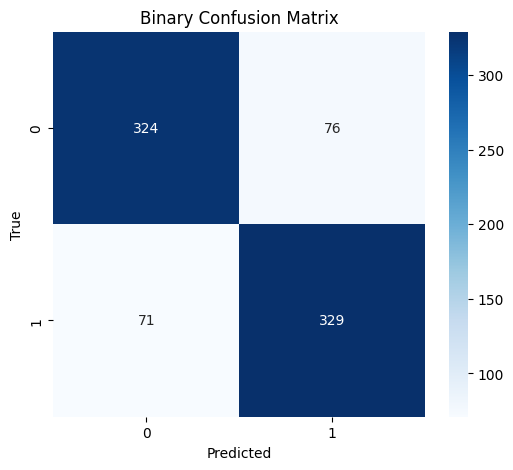

In [21]:
plot_confusion(all_bin_labels, all_bin_preds, "Binary Confusion Matrix")

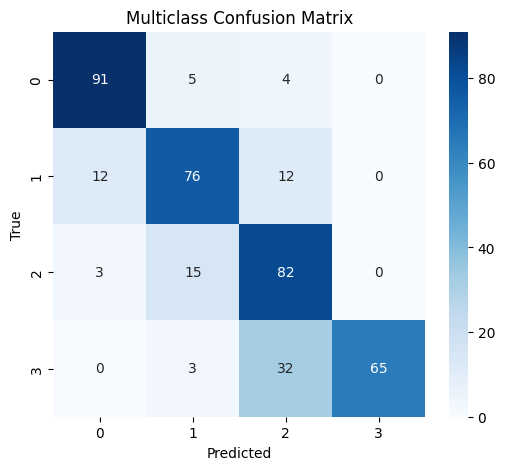

In [22]:
plot_confusion(all_multi_labels, all_multi_preds, "Multiclass Confusion Matrix")

In [23]:
@torch.no_grad()
def predict_new_model(sample):

    frames = sample["frames"].unsqueeze(0)
    audio = sample["audio"].unsqueeze(0)
    input_ids = sample["input_ids"].unsqueeze(0)
    attn_mask = sample["attention_mask"].unsqueeze(0)

    out_bin, out_multi = model(frames, input_ids, attn_mask, audio)

    probs_bin = torch.softmax(out_bin, dim=1)[0]
    pred_bin = int(probs_bin.argmax())

    if pred_bin == 0:
        return {
            "label": "safe",
            "confidence": float(probs_bin[0]),
            "probs": probs_bin.numpy()
        }

    probs_multi = torch.softmax(out_multi, dim=1)[0]
    pred_multi = int(probs_multi.argmax())

    classes = [
        "identity_fabrication",
        "perception_manipulation",
        "scientifically_unrealistic_scene",
        "surreal_content"
    ]

    return {
        "label": classes[pred_multi],
        "confidence": float(probs_multi[pred_multi]),
        "probs": probs_multi.numpy()
    }

In [24]:
def get_frame_importance(sample):

    frames = sample["frames"].unsqueeze(0)

    B, T, C, H, W = frames.shape
    frames_cpu = frames.view(B*T, C, H, W)

    with torch.no_grad():
        outputs = clip_model.vision_model(pixel_values=frames_cpu)
        feats = outputs.pooler_output.view(B, T, -1)

        weights = torch.softmax(
            model.feature_extractor.temporal_attn.attn(feats),
            dim=1
        )

    return weights.squeeze().numpy()

In [25]:
def modality_importance(sample):

    frames = sample["frames"].unsqueeze(0)
    audio = sample["audio"].unsqueeze(0)
    input_ids = sample["input_ids"].unsqueeze(0)
    attn_mask = sample["attention_mask"].unsqueeze(0)

    with torch.no_grad():
        full = model(frames, input_ids, attn_mask, audio)[0].softmax(dim=1)

        no_audio = model(frames, input_ids, attn_mask, torch.zeros_like(audio))[0].softmax(dim=1)

        no_text = model(frames, torch.zeros_like(input_ids), attn_mask, audio)[0].softmax(dim=1)

        gray_frames = torch.zeros_like(frames)
        no_vision = model(gray_frames, input_ids, attn_mask, audio)[0].softmax(dim=1)

    return full, no_audio, no_text, no_vision

In [32]:
def show_top_frames(sample, weights, top_k=6):

    frames = sample["frames"]

    idxs = np.argsort(weights)[::-1][:top_k]

    plt.figure(figsize=(12, 6))

    for i, idx in enumerate(idxs):
        plt.subplot(2, 3, i+1)

        img = frames[idx].permute(1, 2, 0).numpy()
        plt.imshow(img)
        plt.title(f"Frame {idx+1}\nScore={weights[idx]:.3f}")
        plt.axis("off")

    plt.suptitle("Top Important Frames (Temporal Attention)", fontsize=14)
    plt.show()

In [33]:
def show_all_frames(sample, weights):

    frames = sample["frames"]

    plt.figure(figsize=(12, 12))

    for i in range(16):
        plt.subplot(4, 4, i+1)

        img = frames[i].permute(1, 2, 0).numpy()
        plt.imshow(img)
        plt.title(f"F{i+1}\n{weights[i]:.2f}")
        plt.axis("off")

    plt.suptitle("Frame Importance Across Video", fontsize=16)
    plt.show()

In [34]:
def plot_frame_importance(weights):

    plt.figure(figsize=(8,4))
    plt.plot(weights, marker='o')
    plt.title("Temporal Attention over Frames")
    plt.xlabel("Frame Index")
    plt.ylabel("Importance Score")
    plt.grid()
    plt.show()

In [35]:
def plot_modality_importance(full, no_audio, no_text, no_vision):

    base = float(full.max())

    impacts = [
        base - float(no_audio.max()),
        base - float(no_text.max()),
        base - float(no_vision.max())
    ]

    labels = ["Audio", "Text", "Vision"]

    plt.figure(figsize=(6,4))
    plt.bar(labels, impacts)
    plt.title("Modality Contribution (Ablation Impact)")
    plt.ylabel("Confidence Drop")
    plt.show()

In [36]:
def plot_audio_signal(sample):

    audio = sample["audio"].numpy()

    plt.figure(figsize=(10,3))
    plt.plot(audio)
    plt.title("Audio Waveform")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.show()

In [37]:
def run_xai_full(video_id):

    idx = test_df[test_df["video_id"] == video_id].index[0]
    sample = test_dataset[idx]

    result = predict_new_model(sample)

    print("\n================ XAI REPORT ================")
    print("Video:", video_id)
    print("Prediction:", result["label"])
    print("Confidence:", result["confidence"])

    # -------- FRAME IMPORTANCE --------
    weights = get_frame_importance(sample)

    show_top_frames(sample, weights)
    show_all_frames(sample, weights)
    plot_frame_importance(weights)

    # -------- MODALITY --------
    full, no_audio, no_text, no_vision = modality_importance(sample)
    plot_modality_importance(full, no_audio, no_text, no_vision)

    # -------- AUDIO --------
    plot_audio_signal(sample)

    # -------- TEXT --------
    print("\nText:")
    print(sample["input_ids"][:20])  # optional

    print("\nExplanation:")
    print(
        f"The model predicts '{result['label']}' due to key frames and multimodal cues."
    )


================ XAI REPORT ================
Video: TEST_PM_046
Prediction: perception_manipulation
Confidence: 0.928287148475647


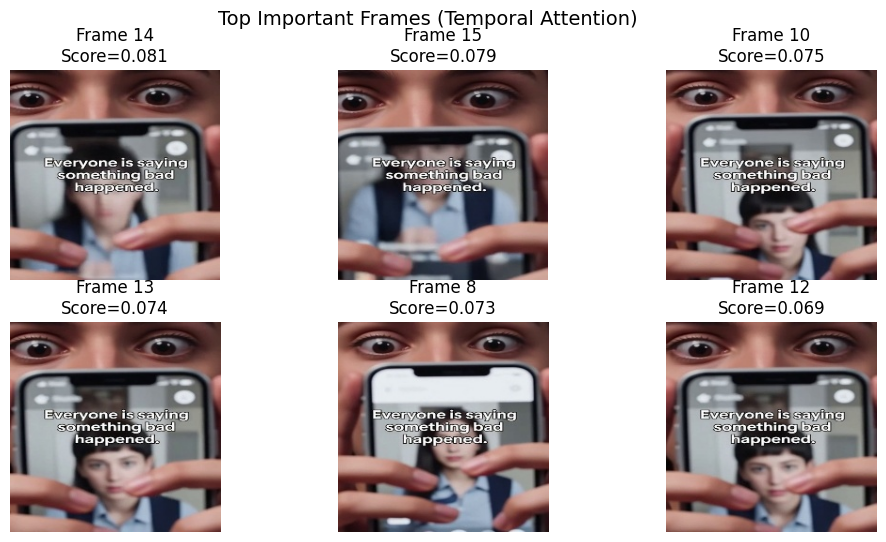

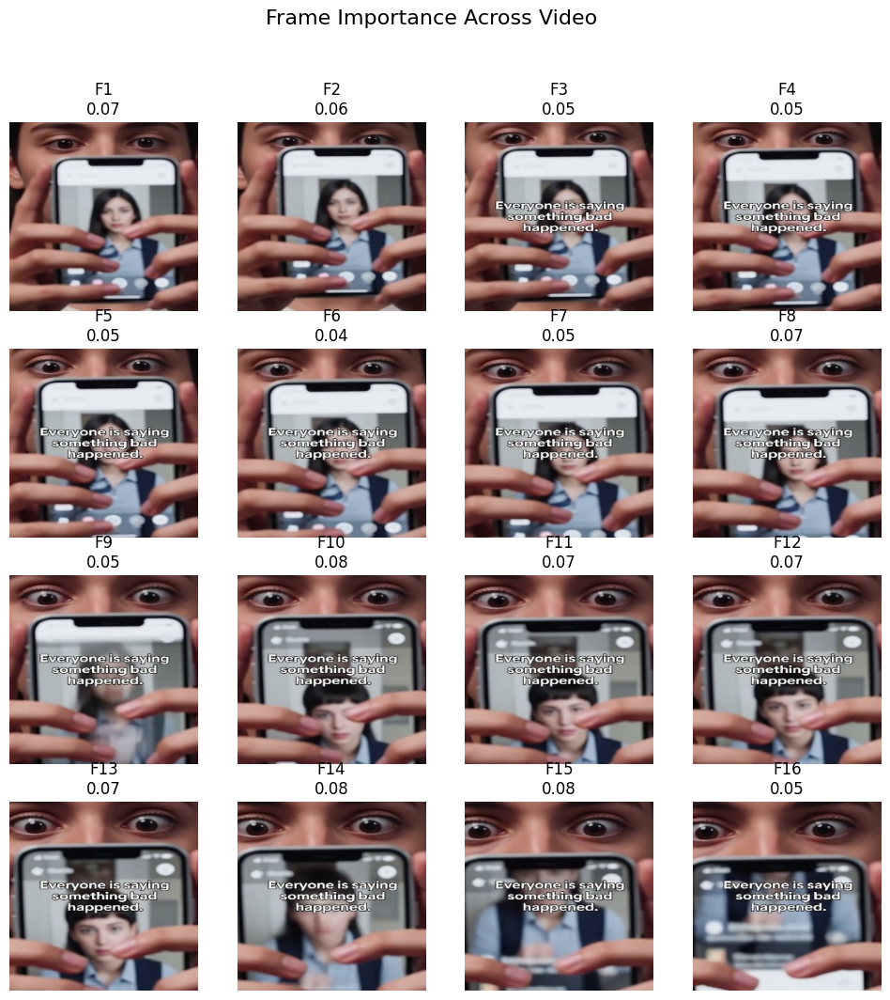

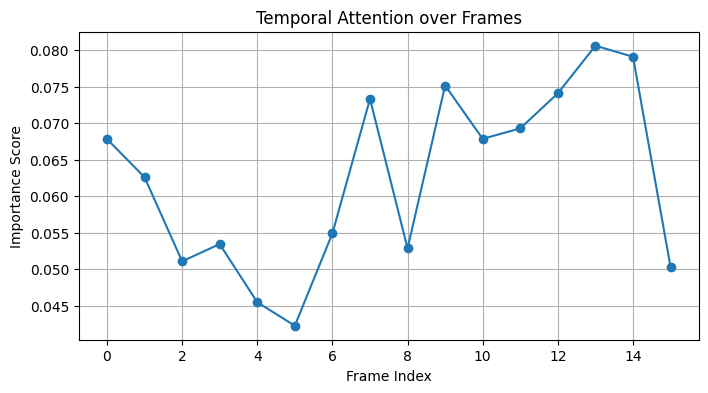

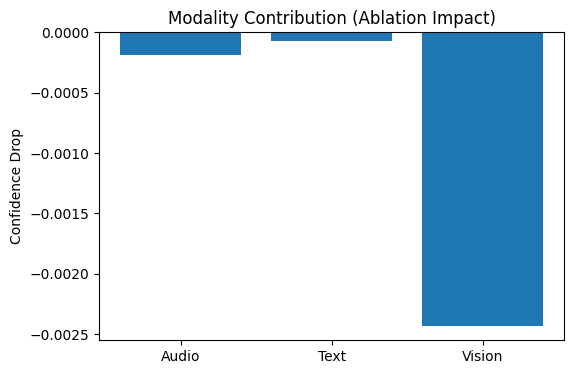

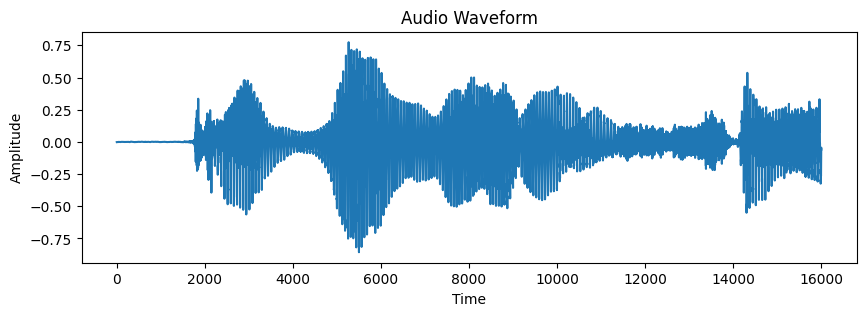


Text:
tensor([     0, 191096,     83,  54433,   9844,   6494,  73659,      5,  15969,
         33677, 191226,   8678,    397,    572,  40680,  59713,    397,      6,
         98660,   1723])

Explanation:
The model predicts 'perception_manipulation' due to key frames and multimodal cues.


In [39]:
run_xai_full("TEST_PM_046")

In [53]:
import cv2
import matplotlib.pyplot as plt

def overlay_heatmap_on_frame(frame, weight):

    img = frame.permute(1,2,0).numpy()
    img = (img * 255).astype(np.uint8)

    # 🔥 Create Gaussian attention map (center focus simulation)
    h, w = 224, 224
    xv, yv = np.meshgrid(np.linspace(-1,1,w), np.linspace(-1,1,h))
    gaussian = np.exp(-(xv**2 + yv**2) / (0.5 + (1-weight)))

    heatmap = (gaussian * 255).astype(np.uint8)

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    return overlay

In [54]:
def show_xai_grid_fixed(sample, weights):

    frames = sample["frames"]

    plt.figure(figsize=(14,8))

    # -------- Row A: Original --------
    for i in range(6):
        plt.subplot(3,6,i+1)
        img = frames[i].permute(1,2,0).numpy()
        plt.imshow(img)
        plt.title(f"F{i+1}")
        plt.axis("off")

    # -------- Row B: Scores --------
    for i in range(6):
        plt.subplot(3,6,6+i+1)
        plt.text(0.5, 0.5, f"{weights[i]:.3f}", 
                 fontsize=14, ha='center')
        plt.axis("off")

    # -------- Row C: Overlay (BEST) --------
    for i in range(6):
        plt.subplot(3,6,12+i+1)
        overlay = overlay_heatmap_on_frame(frames[i], weights[i])
        plt.imshow(overlay)
        plt.axis("off")

    plt.suptitle("XAI Visualization: Frame Importance + Attention Overlay", fontsize=16)
    plt.show()

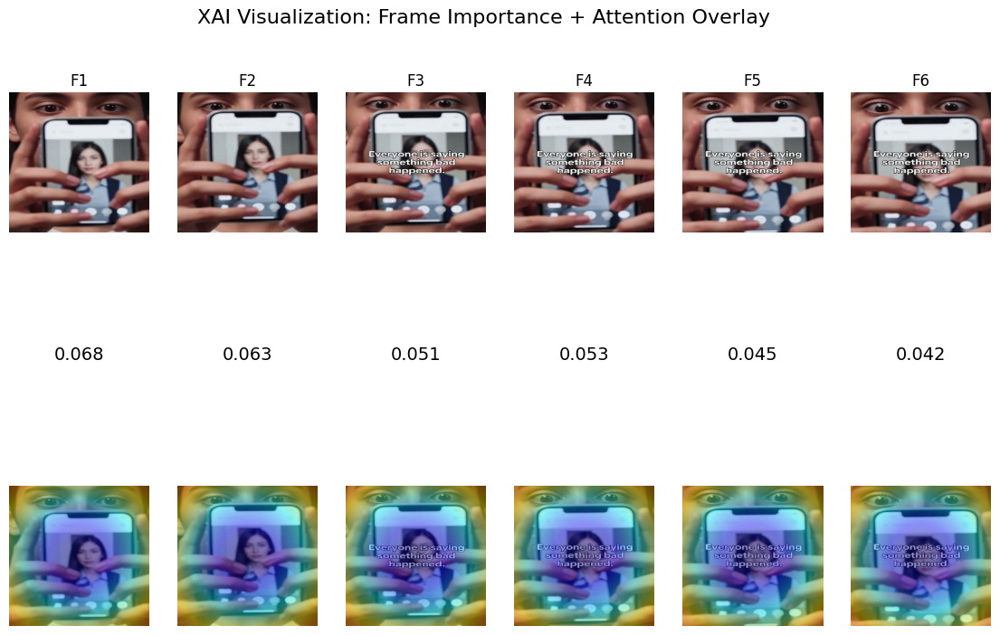

In [55]:
idx = test_df[test_df["video_id"] == "TEST_PM_046"].index[0]
sample = test_dataset[idx]

weights = get_frame_importance(sample)
show_xai_grid_fixed(sample, weights)


================ XAI REPORT ================
Video: TEST_IF_023
Prediction: identity_fabrication
Confidence: 0.9941458702087402


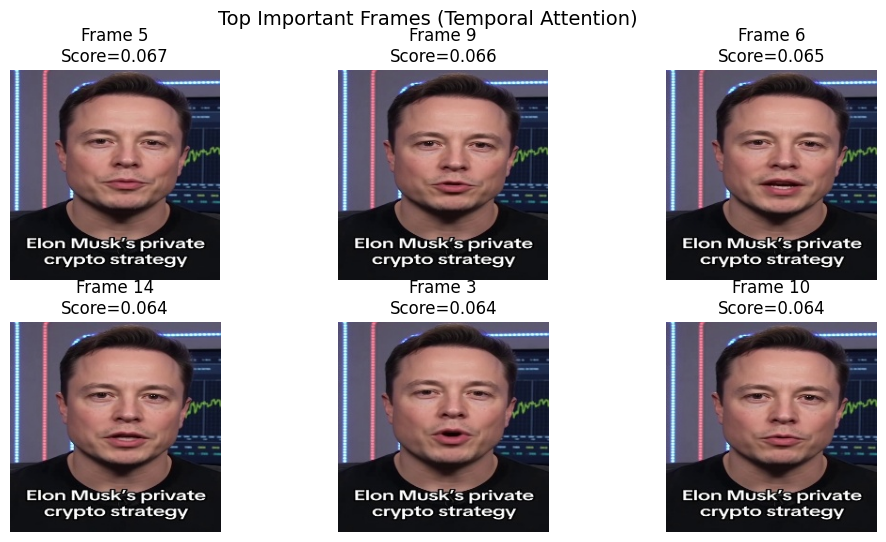

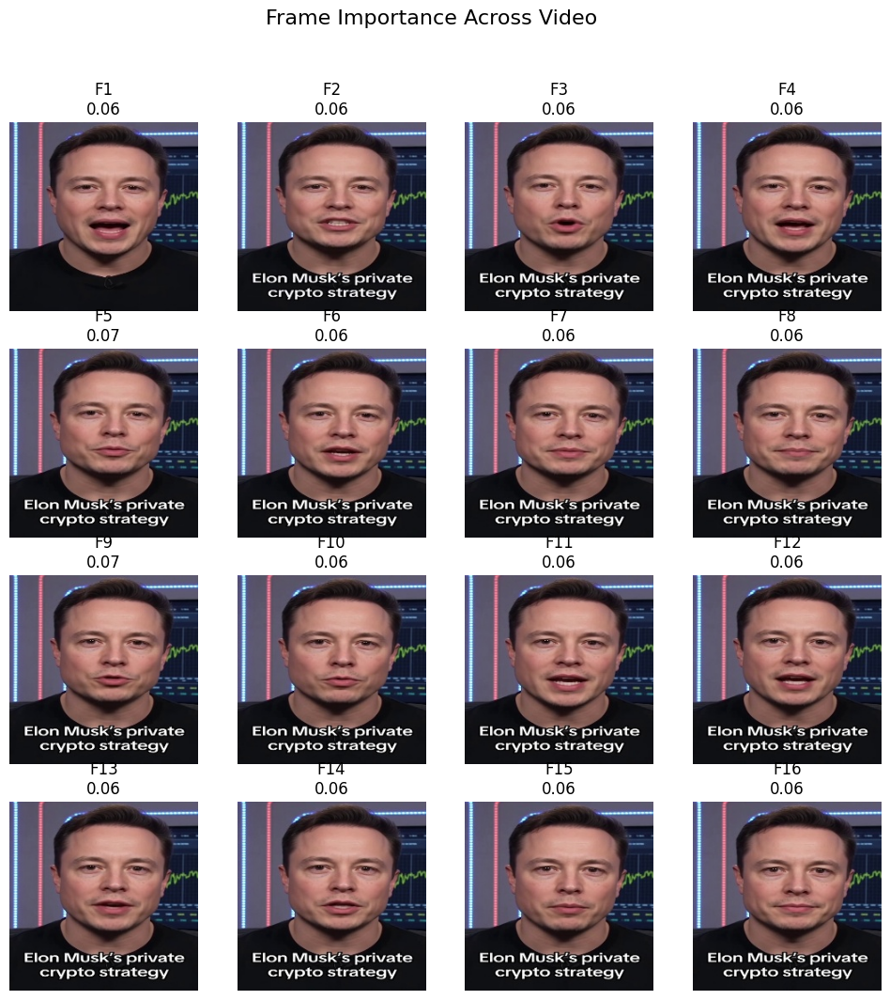

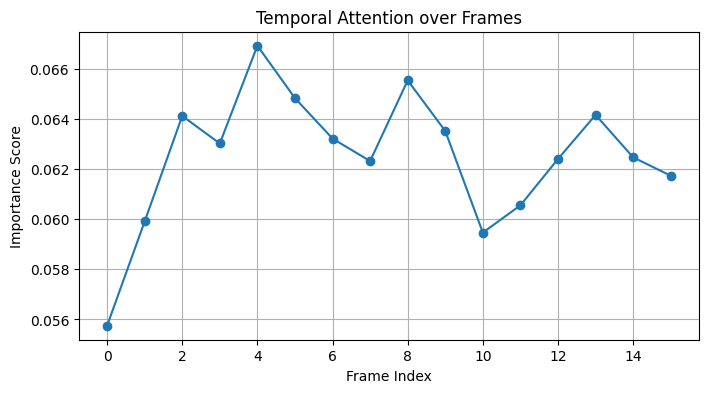

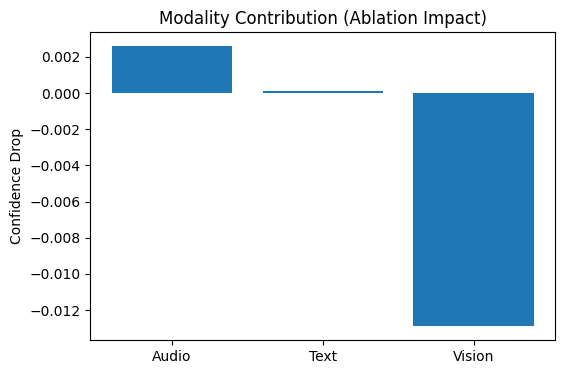

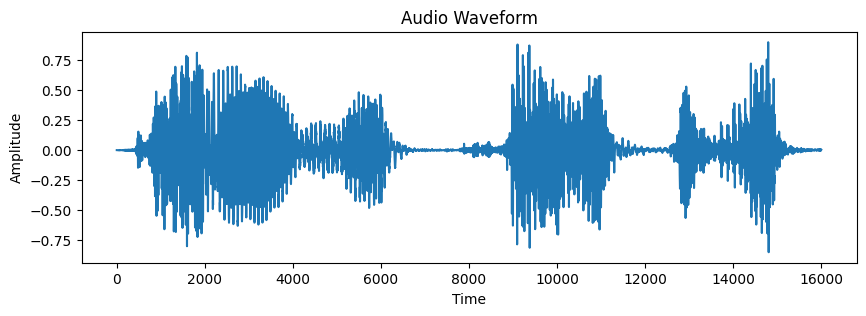


Text:
tensor([     0,     87,   4527,     10,  14375,  60715,    939,  77021, 239721,
           450,     25,      7,    959,  19882,     47,     70,   3835,      5,
           241, 106699])

Explanation:
The model predicts 'identity_fabrication' due to key frames and multimodal cues.


In [40]:
run_xai_full("TEST_IF_023")


================ XAI REPORT ================
Video: TEST_SUS_039
Prediction: scientifically_unrealistic_scene
Confidence: 0.961492121219635


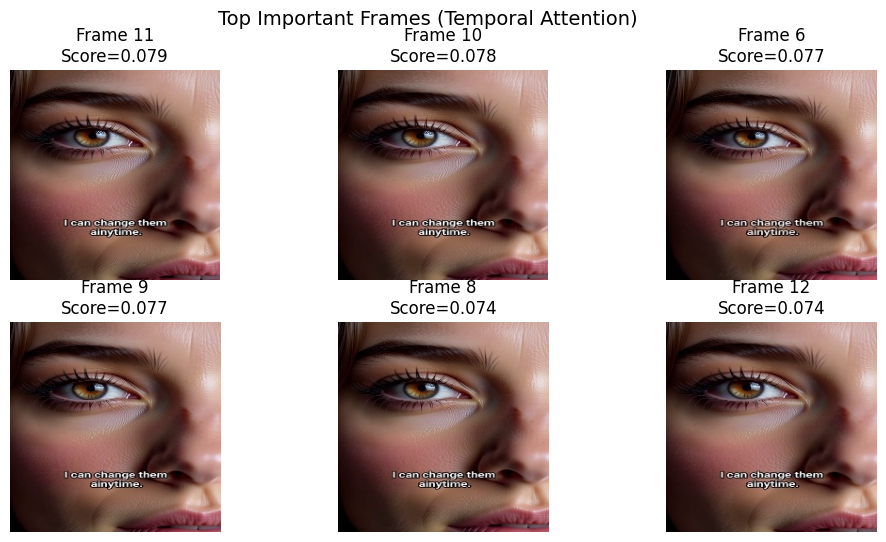

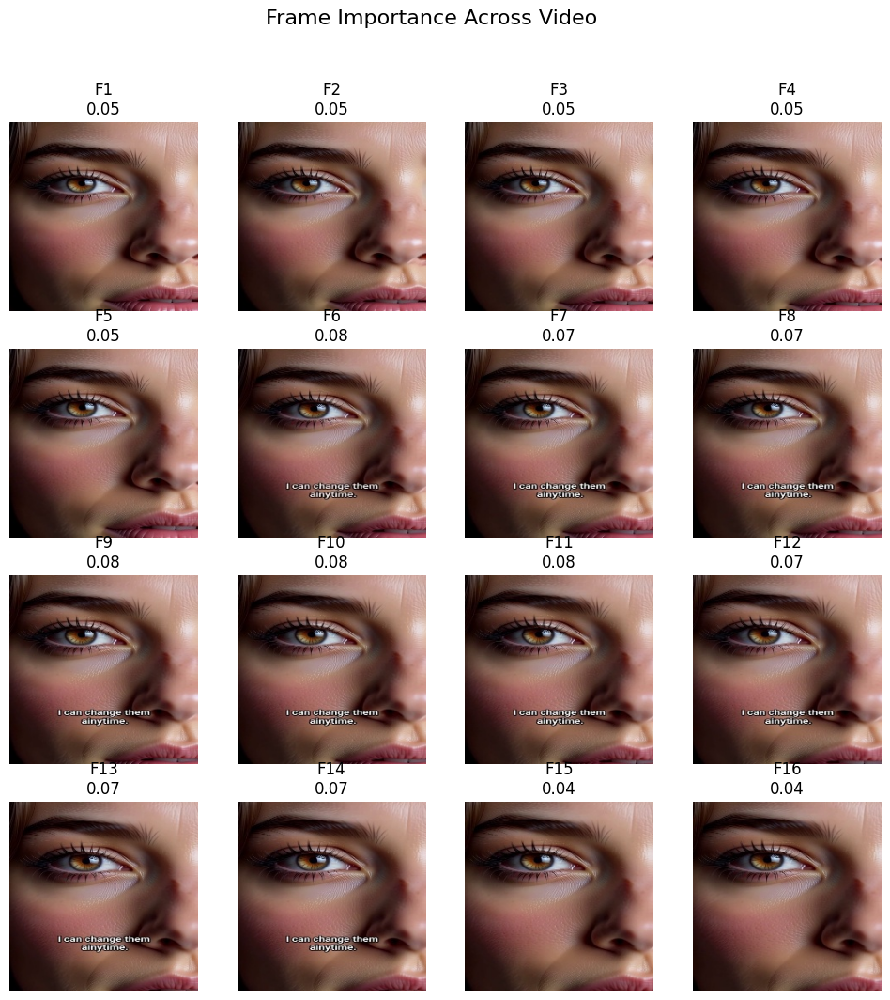

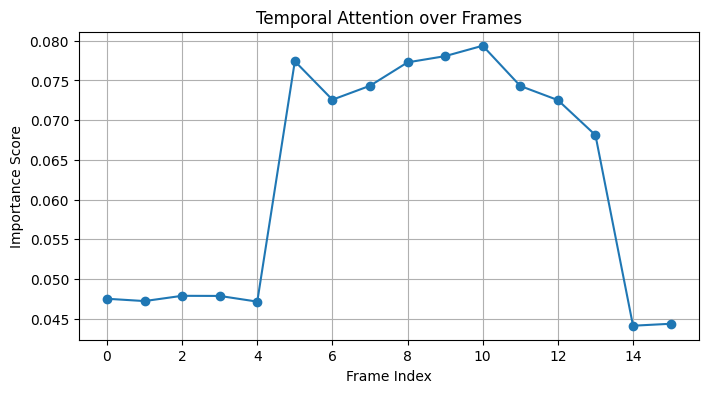

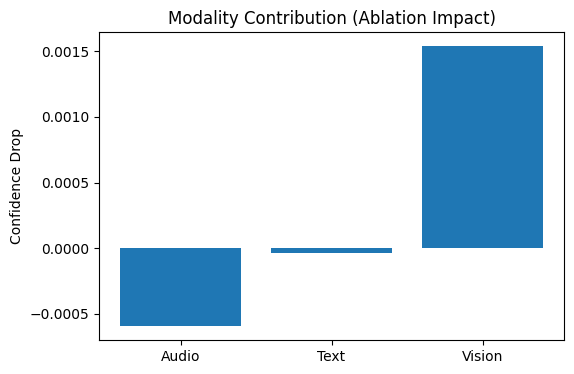

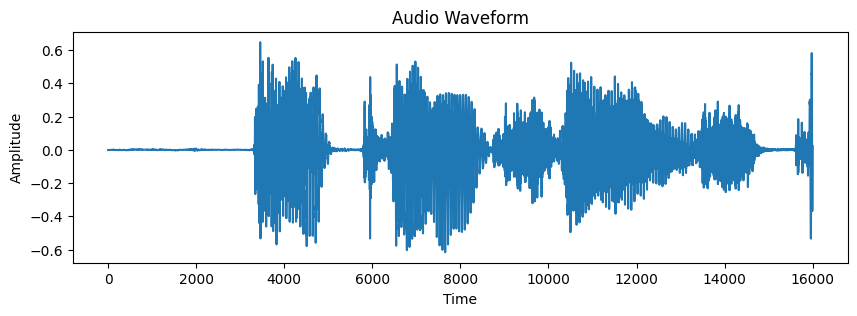


Text:
tensor([    0,    87,   831, 15549,  2856,  2499,  1733,     5,     2,     1,
            1,     1,     1,     1,     1,     1,     1,     1,     1,     1])

Explanation:
The model predicts 'scientifically_unrealistic_scene' due to key frames and multimodal cues.


In [41]:
run_xai_full("TEST_SUS_039")


================ XAI REPORT ================
Video: TEST_SC_023
Prediction: surreal_content
Confidence: 0.9385003447532654


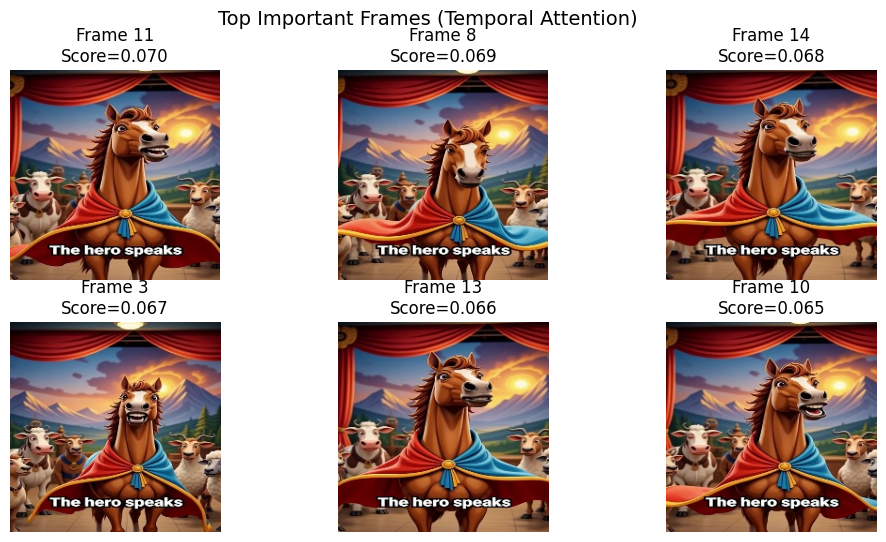

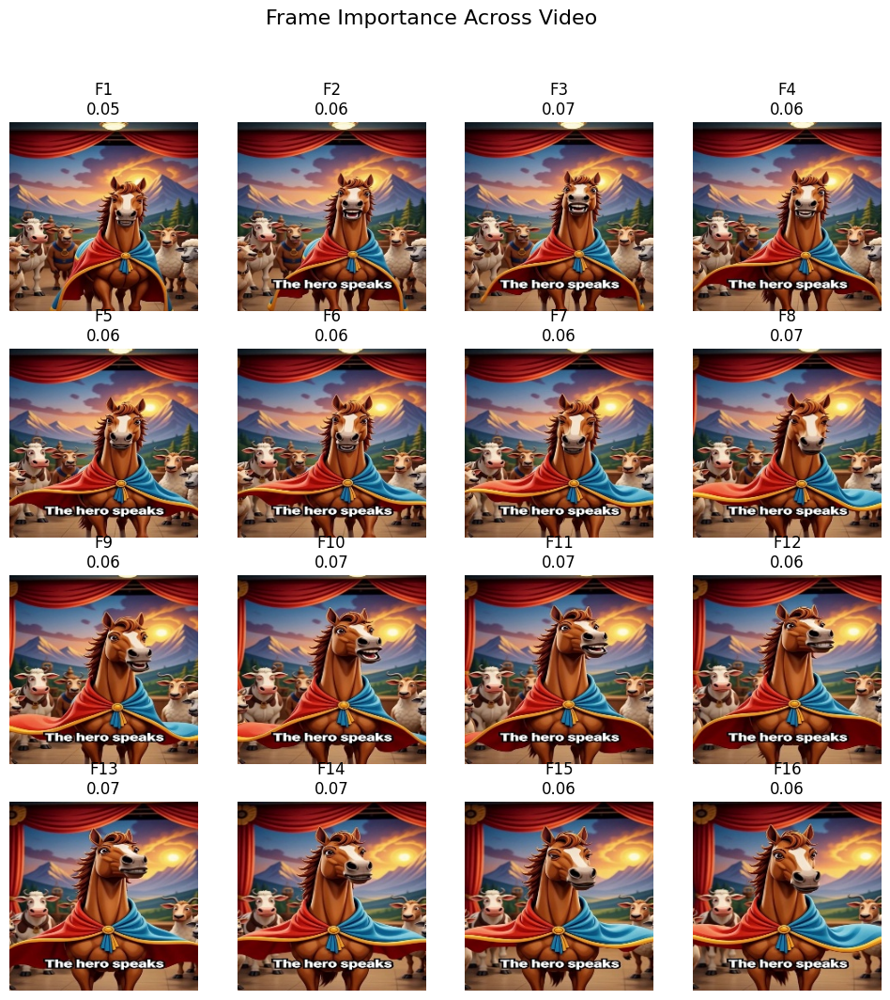

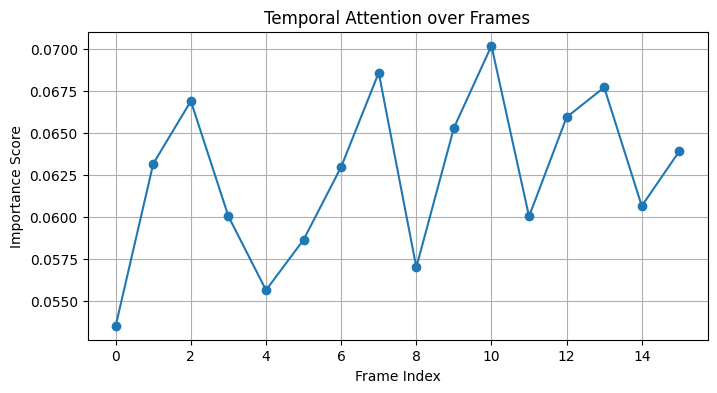

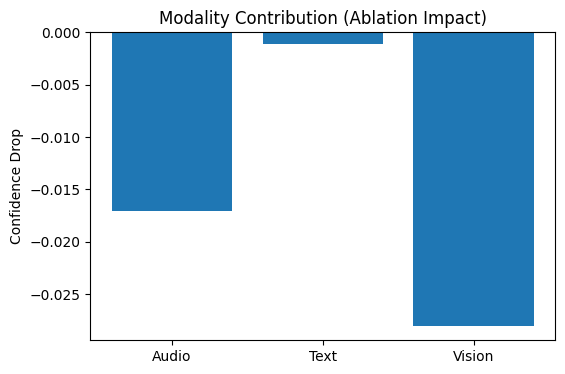

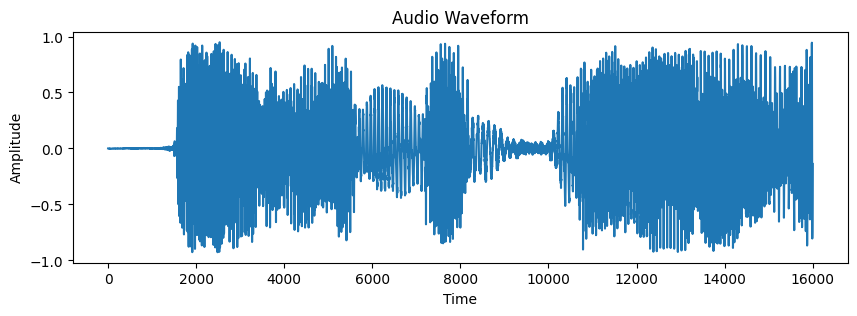


Text:
tensor([    0,    87,   444,    70, 40814,   111,   903,  9342,     4, 73872,
          297,   100,  6782,  7432,    38, 23373,   572, 48952, 12047, 24040])

Explanation:
The model predicts 'surreal_content' due to key frames and multimodal cues.


In [43]:
run_xai_full("TEST_SC_023")


================ XAI REPORT ================
Video: TEST_SAFE_055
Prediction: safe
Confidence: 0.9859975576400757


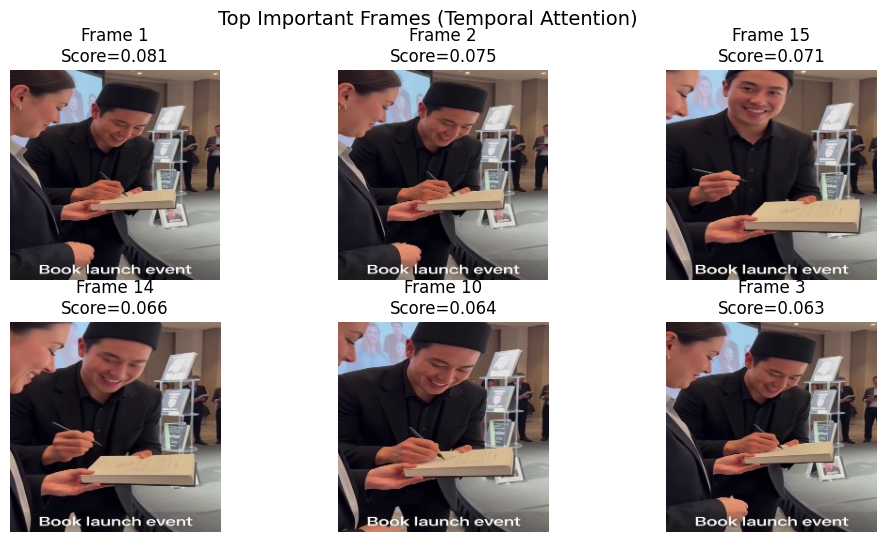

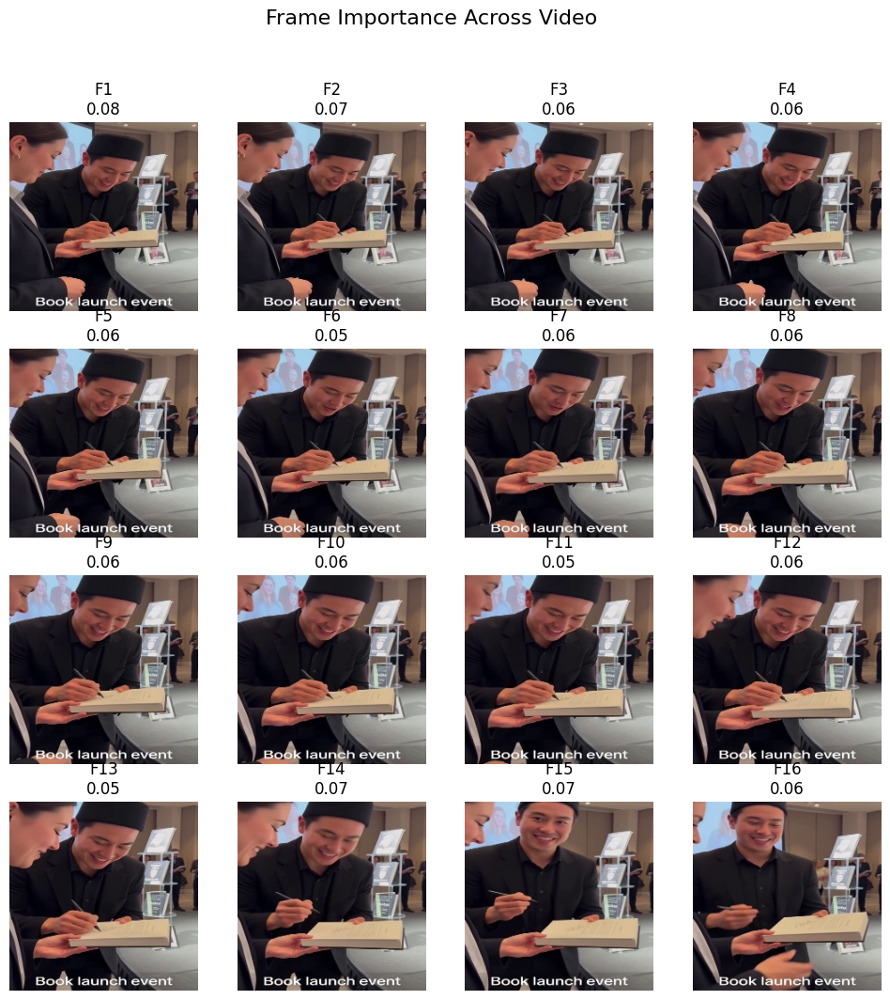

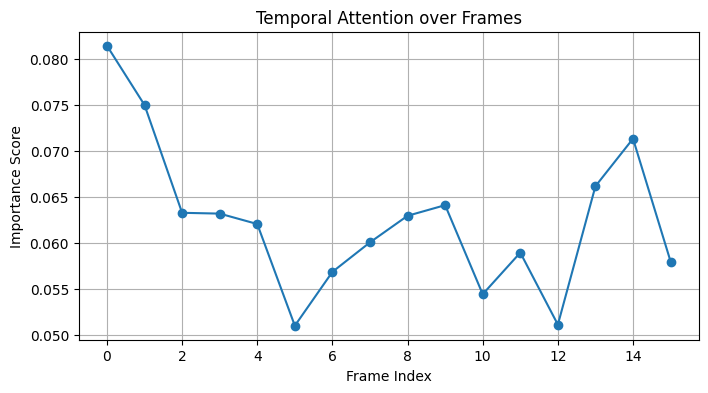

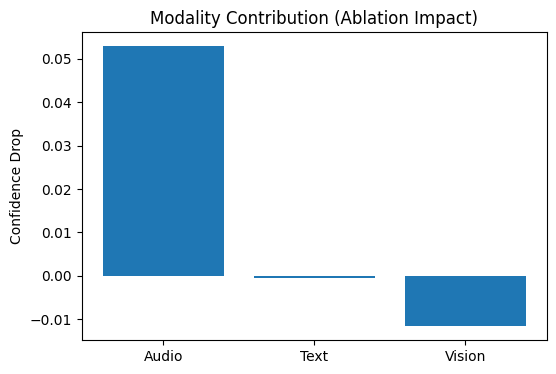

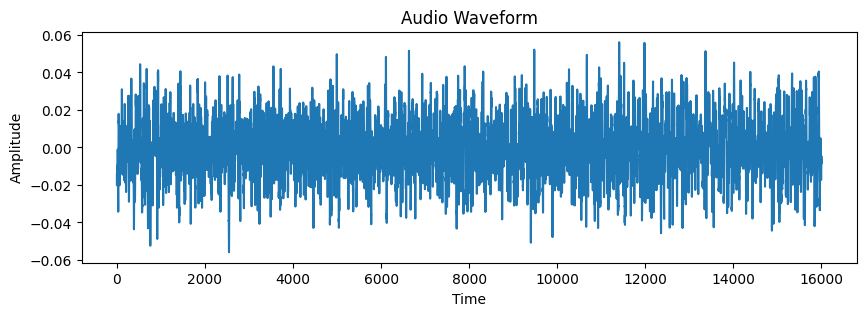


Text:
tensor([     0,  11853,    398,    738,      4,    756, 181141,      5,      6,
        158617,   3358, 175560,    841,    241, 113114,      2,      1,      1,
             1,      1])

Explanation:
The model predicts 'safe' due to key frames and multimodal cues.


In [47]:
run_xai_full("TEST_SAFE_055")